## Cheap Method
- Train model with n * m training samples
- Each training example has 14 features
- Try using SVM, NN
- Test using your sentinel or some other downloaded data
- Later try other unsupervised pixel classification techniques
- For now, classes are 1 - water and 0 - not water

## This is just to see what happens, to make our segments smooth, finally we have to use a different method (like one pixel class depends on x surrounding pixels' class)

In [38]:
import pandas as pd
from rasterio import plot
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import rasterio
import matplotlib.pyplot as plt
from keras.layers import LeakyReLU
from sklearn.model_selection import train_test_split
from sklearn import svm
from helpers import return_indices
import os

In [2]:
def normalize(image):
    return (image-image.min())/(image.max()-image.min())

In [3]:
mndwi_4_11 = rasterio.open("./All_Indices/mndwi_4_11.tif")

In [4]:
df = pd.read_csv("./final_data.csv")

In [5]:
df.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,9,10,11,12,target,pixel_positions
0,0,0.03105,0.039179,0.027175,0.033172,0.034918,0.035770,0.026285,0.039213,0.017457,0.018640,0.309795,0.677882,0.386606,0,"(0, 88)"
1,1,0.02993,0.039179,0.025234,0.029279,0.037101,0.037338,0.025467,0.034930,0.016972,0.018220,0.314363,0.675721,0.384604,0,"(0, 89)"
2,2,0.03137,0.039468,0.026447,0.029279,0.037101,0.037338,0.027570,0.034930,0.016972,0.018220,0.321962,0.680696,0.369523,0,"(0, 90)"
3,3,0.03281,0.038022,0.025234,0.030681,0.038036,0.035770,0.027103,0.034529,0.016892,0.018304,0.325234,0.676695,0.371481,0,"(0, 91)"
4,4,0.03153,0.038456,0.025840,0.030681,0.038036,0.035770,0.026051,0.034529,0.016892,0.018304,0.315110,0.679193,0.379005,0,"(0, 92)"


In [6]:
df.drop(columns = ["Unnamed: 0"], inplace=True)

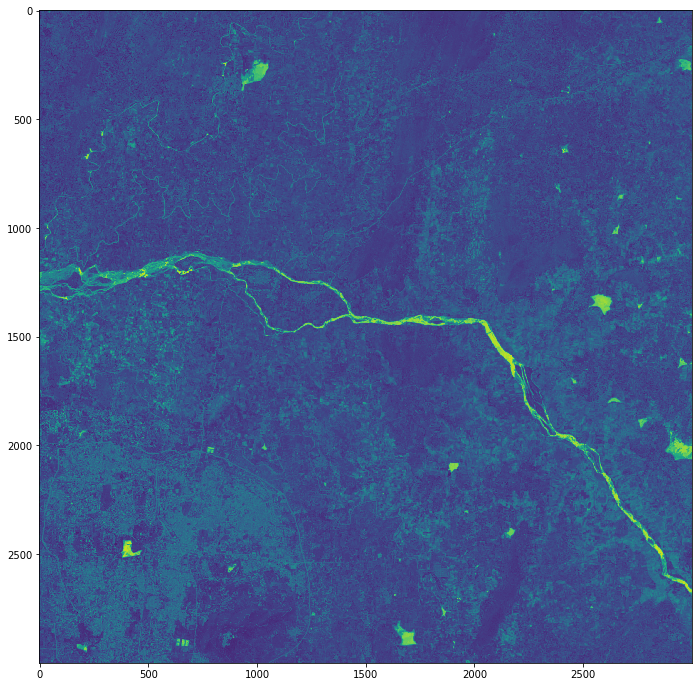

In [33]:
TEST_CROP_Y = [6000, 9000]
TEST_CROP_X = [3500, 6500]
mndwi_4_11 = rasterio.open('./All_Indices/mndwi_4_11.tif').read(1)
fig = plt.figure(figsize=(12,12))
plot.show(mndwi_4_11[TEST_CROP_Y[0]:TEST_CROP_Y[1], TEST_CROP_X[0]:TEST_CROP_X[1]])
# This is used to test

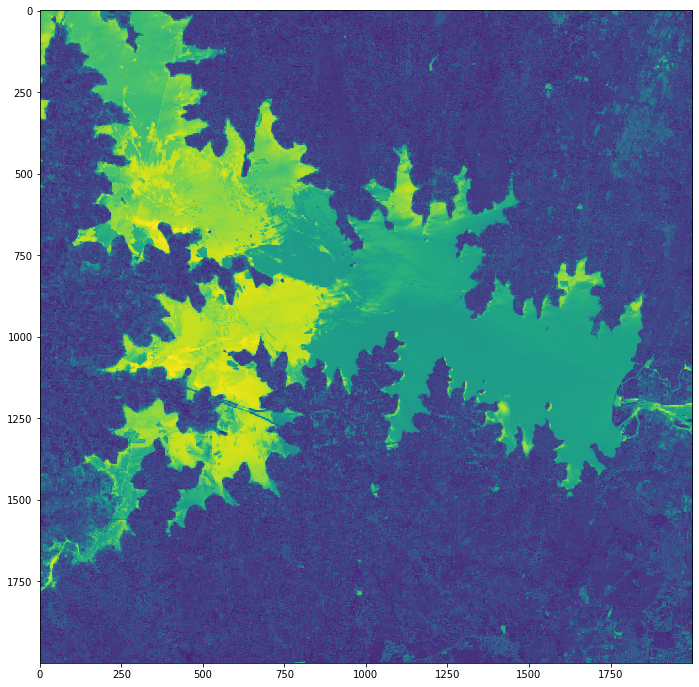

In [12]:
# This was used in training
fig = plt.figure(figsize=(12,12))
plot.show(mndwi_4_11[6000:8000, 1500:3500])

In [13]:
# Check validity of data with pixel_positions field in dataframe and above image
feature_list = ["B2", "B3", "B4", "B05", "B06", "B07", "B8", "B08A", 
                "B11", "B12", "ndvi_8_4", "mndwi_4_11", "ndbi_11_8"]
df[df["target"]==1]

,0,1,2,3,4,5,6,7,8,9,10,11,12,target,pixel_positions
60,0.035851,0.044528,0.031421,0.034418,0.039595,0.038620,0.028505,0.037072,0.015356,0.016709,0.303208,0.719283,0.335892,1,"(0, 148)"
61,0.034091,0.043227,0.031785,0.034418,0.039595,0.038620,0.028621,0.037072,0.015356,0.016709,0.302207,0.720592,0.335105,1,"(0, 149)"
62,0.033291,0.044528,0.030329,0.034263,0.040530,0.038050,0.028505,0.037206,0.016488,0.016793,0.308490,0.701620,0.355043,1,"(0, 150)"
63,0.033611,0.044817,0.030086,0.034263,0.040530,0.038050,0.028388,0.037206,0.016488,0.016793,0.308931,0.700708,0.355842,1,"(0, 151)"
64,0.034411,0.045829,0.029237,0.032549,0.038504,0.038335,0.027570,0.036403,0.015275,0.016373,0.307855,0.712246,0.340857,1,"(0, 152)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1681245,0.037932,0.055371,0.080189,0.158854,0.265316,0.271911,0.236916,0.295905,0.205851,0.148027,0.671664,0.189237,0.629430,1,"(1645, 1995)"
1681246,0.042894,0.068093,0.103239,0.203707,0.348558,0.389483,0.302336,0.399893,0.249495,0.184383,0.687468,0.184910,0.615417,1,"(1645, 1996)"
1681247,0.066901,0.107417,0.183914,0.203707,0.348558,0.389483,0.316238,0.399893,0.249495,0.184383,0.556250,0.307111,0.598258,1,"(1645, 1997)"
1681248,0.080666,0.128813,0.200170,0.288584,0.390959,0.399031,0.303388,0.394941,0.308090,0.241226,0.518351,0.266748,0.699065,1,"(1645, 1998)"


In [14]:
# Make sure all 1s are present in training data (some train some test)

In [15]:
dataset = (df[df["target"]==1].append(df[df["target"]==0].sample(n=500000))).sample(frac=1)

In [16]:
dataset

,0,1,2,3,4,5,6,7,8,9,10,11,12,target,pixel_positions
1234642,0.206466,0.242446,0.194104,0.228158,0.195635,0.188542,0.148481,0.175054,0.101511,0.088161,0.297420,0.592334,0.517226,1,"(781, 1239)"
1418849,0.206786,0.235651,0.185612,0.199969,0.183164,0.183697,0.146262,0.179872,0.105795,0.091856,0.306022,0.568947,0.538627,1,"(971, 1665)"
1556652,0.176376,0.209339,0.160621,0.173805,0.167732,0.163888,0.127220,0.161001,0.097228,0.081696,0.305956,0.557601,0.553764,1,"(1296, 1745)"
1127595,0.213348,0.260518,0.220066,0.248092,0.193765,0.186547,0.145093,0.172109,0.098198,0.083543,0.253290,0.633388,0.512354,1,"(689, 1043)"
1464436,0.197823,0.224375,0.172025,0.183928,0.172408,0.168733,0.131308,0.163142,0.100218,0.084887,0.295684,0.565743,0.554766,1,"(1041, 1503)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937349,0.040813,0.057106,0.081160,0.145616,0.254248,0.282314,0.232593,0.311028,0.186697,0.132326,0.663978,0.216292,0.596968,0,"(556, 1932)"
1662423,0.064821,0.092959,0.133568,0.228781,0.339673,0.351575,0.280607,0.381424,0.266386,0.196222,0.604622,0.217450,0.670001,0,"(1596, 1859)"
1173234,0.218950,0.246350,0.186947,0.210248,0.191426,0.187260,0.147897,0.172377,0.099329,0.085474,0.307304,0.589182,0.510146,1,"(727, 1025)"
965698,0.204385,0.231892,0.196773,0.214297,0.199844,0.185977,0.150467,0.174384,0.100865,0.084971,0.297426,0.597627,0.510100,1,"(575, 783)"


In [18]:
# All training samples with low mndwi value
low = df[df["11"]<0.5]

# All training samples with high mndwi value
high = df[df["11"]>=0.5]

len(low), len(high)

(1271448, 454380)

In [19]:
# Among lows, 0s should be higher percentage of the target
print(len(low[low["target"]==1]), len(low[low["target"]==0]))

# Among highs, 1s should be higher percentage of the target
print(len(high[high["target"]==1]), len(high[high["target"]==0]))

83742 1187706
399204 55176


In [21]:
print(83742  / 1271448)
print(399204  / 454380)

# So, 6.6% of samples with a low mndwi value are water
# And, 12.15% of samples with a high mndwi value are non-water elements

0.06586348792872379
0.878568598970025


In [22]:
#X = dataset.drop(columns = ["target", "pixel_positions"])
X = dataset.drop(columns = ["target", "pixel_positions"]) # using all features
y = dataset["target"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [23]:
X_train.shape[0], X_test.shape[0]

(658573, 324373)

In [25]:
1 - sum(y_train==1)/y_train.shape[0] # No skew towards any type of samples

0.5094363115402545

In [59]:
model = tf.keras.Sequential([
    layers.Dense(256, activation=LeakyReLU(), input_shape=(13,)),
    layers.Dense(256, activation=LeakyReLU()),
    layers.Dropout(0.2),
    layers.Dense(256, activation=LeakyReLU()),
    layers.Dropout(0.2),
    layers.Dense(1, activation='sigmoid')])

model.compile(optimizer=tf.keras.optimizers.Adam(0.01),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [60]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 256)               3584      
_________________________________________________________________
dense_5 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout_2 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_6 (Dense)              (None, 256)               65792     
_________________________________________________________________
dropout_3 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 257       
Total params: 135,425
Trainable params: 135,425
Non-trainable params: 0
________________________________________________

In [61]:
model.fit(x = X_train, y = y_train, batch_size = 256, epochs = 10, validation_split = 0.2)

Train on 526858 samples, validate on 131715 samples
Epoch 1/10
526858/526858 [==============================] - 6s 12us/sample - loss: 0.3135 - acc: 0.8930 - val_loss: 0.3094 - val_acc: 0.8929
Epoch 2/10
526858/526858 [==============================] - 6s 11us/sample - loss: 0.3079 - acc: 0.8938 - val_loss: 0.3798 - val_acc: 0.8909
Epoch 3/10
526858/526858 [==============================] - 6s 12us/sample - loss: 0.5001 - acc: 0.8886 - val_loss: 0.3234 - val_acc: 0.8922
Epoch 4/10
526858/526858 [==============================] - 6s 12us/sample - loss: 0.3080 - acc: 0.8930 - val_loss: 0.3091 - val_acc: 0.8917
Epoch 5/10
526858/526858 [==============================] - 6s 12us/sample - loss: 0.3093 - acc: 0.8930 - val_loss: 0.2997 - val_acc: 0.8927
Epoch 6/10
526858/526858 [==============================] - 6s 11us/sample - loss: 0.3063 - acc: 0.8934 - val_loss: 0.2996 - val_acc: 0.8930
Epoch 7/10
526858/526858 [==============================] - 6s 11us/sample - loss: 0.3036 - acc: 0.893

In [62]:
sum(y_train)/len(y_train)

0.4905636884597455

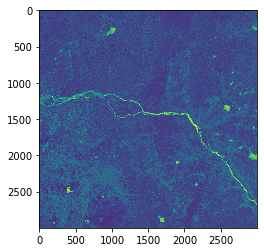

In [63]:
plot.show(mndwi_4_11[TEST_CROP_Y[0]:TEST_CROP_Y[1], TEST_CROP_X[0]:TEST_CROP_X[1]])

In [64]:
# Construct test data
# Replace file names with others if necessary
blue = rasterio.open('./All_Indices/B2.tif')
green = rasterio.open('./All_Indices/B3.tif')
red = rasterio.open('./All_Indices/B4.tif')
vre5 = rasterio.open('./All_Indices/B05.tif')
vre6 = rasterio.open('./All_Indices/B06.tif')
vre7 = rasterio.open('./All_Indices/B07.tif')
nir = rasterio.open('./All_Indices/B8.tif')
vre8a = rasterio.open('./All_Indices/B08A.tif')
swir11 = rasterio.open('./All_Indices/B11.tif')
swir12 = rasterio.open('./All_Indices/B12.tif')

In [65]:
test_feature_list = [blue, green, red, vre5, vre6, vre7, nir, vre8a, swir11, swir12]
test_feature_array = []

In [66]:
# Indices are computed in helpers
for feature in test_feature_list:
    image = feature.read(1)
    test_feature_array.append(image[TEST_CROP_Y[0]:TEST_CROP_Y[1], TEST_CROP_X[0]:TEST_CROP_X[1]])

In [67]:
ndvi, mndwi, ndbi = return_indices(test_feature_array)

In [68]:
test_feature_array.append(ndvi)
test_feature_array.append(mndwi)
test_feature_array.append(ndbi)

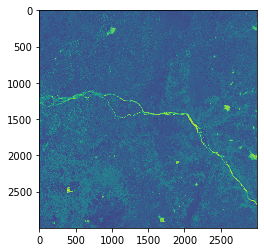

In [69]:
# ndvi from rasterio
plot.show(test_feature_array[-2])

In [71]:
normalized_features = []
for i in range(len(test_feature_array)):
    print(i)
    normalized_features.append(normalize(test_feature_array[i]))

0
1
2
3
4
5
6
7
8
9
10
11
12


In [72]:
normalized_features = np.array(normalized_features)
shp = normalized_features.shape

In [73]:
normalized_features = normalized_features.reshape((shp[0], shp[1]*shp[2]))
normalized_features.shape

(13, 9000000)

In [74]:
normalized_features = normalized_features.T
normalized_features.shape

(9000000, 13)

In [76]:
normalized_features[0].shape

(13,)

In [88]:
y_pred = model.predict(normalized_features)

In [89]:
y_pred.shape

(9000000, 1)

In [90]:
y_pred[y_pred >= 0.5] = 255
y_pred[y_pred < 0.5] = 0

shape = y_pred.shape[0]

In [91]:
y_pred.shape

(9000000, 1)

In [100]:
len(y_pred[y_pred == 255])

223383

In [96]:
final_image = y_pred.reshape((3000, 3000))

In [97]:
final_image.shape

(3000, 3000)

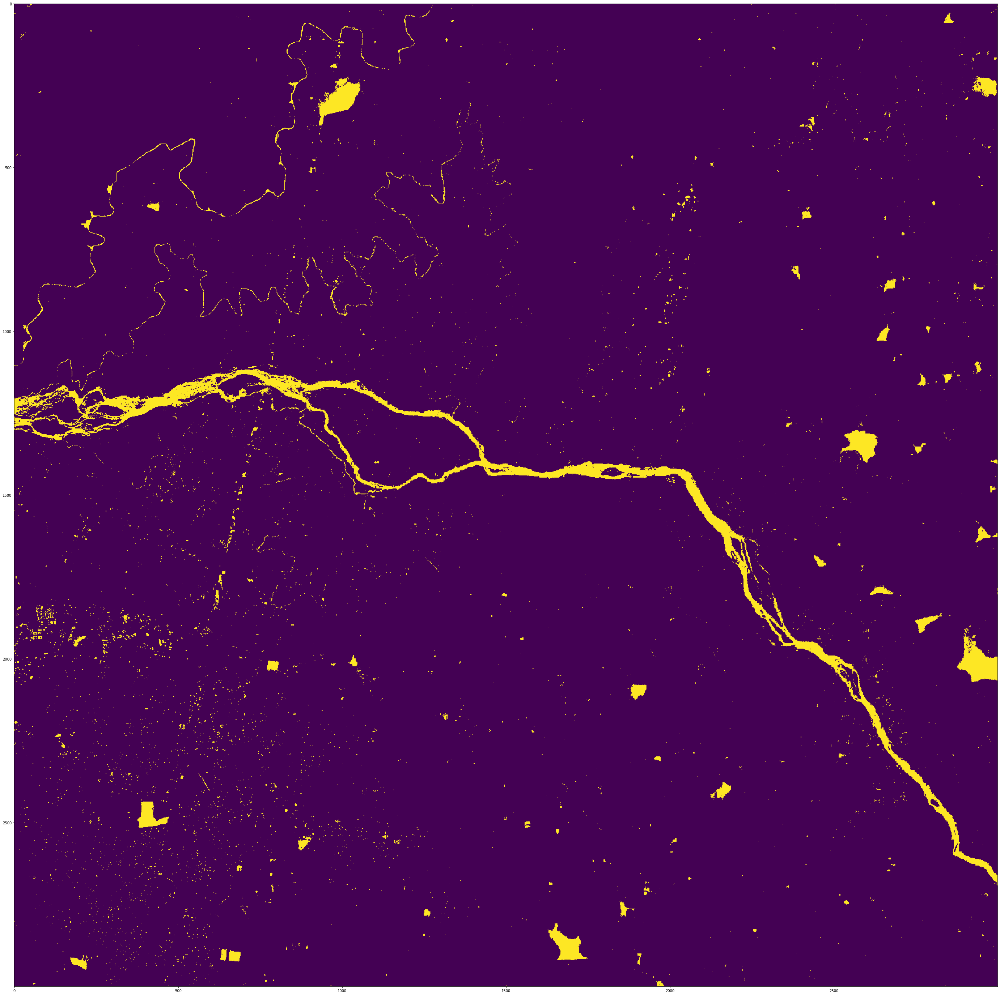

In [101]:
fig = plt.figure(figsize = (50,50))
plot.show(final_image)

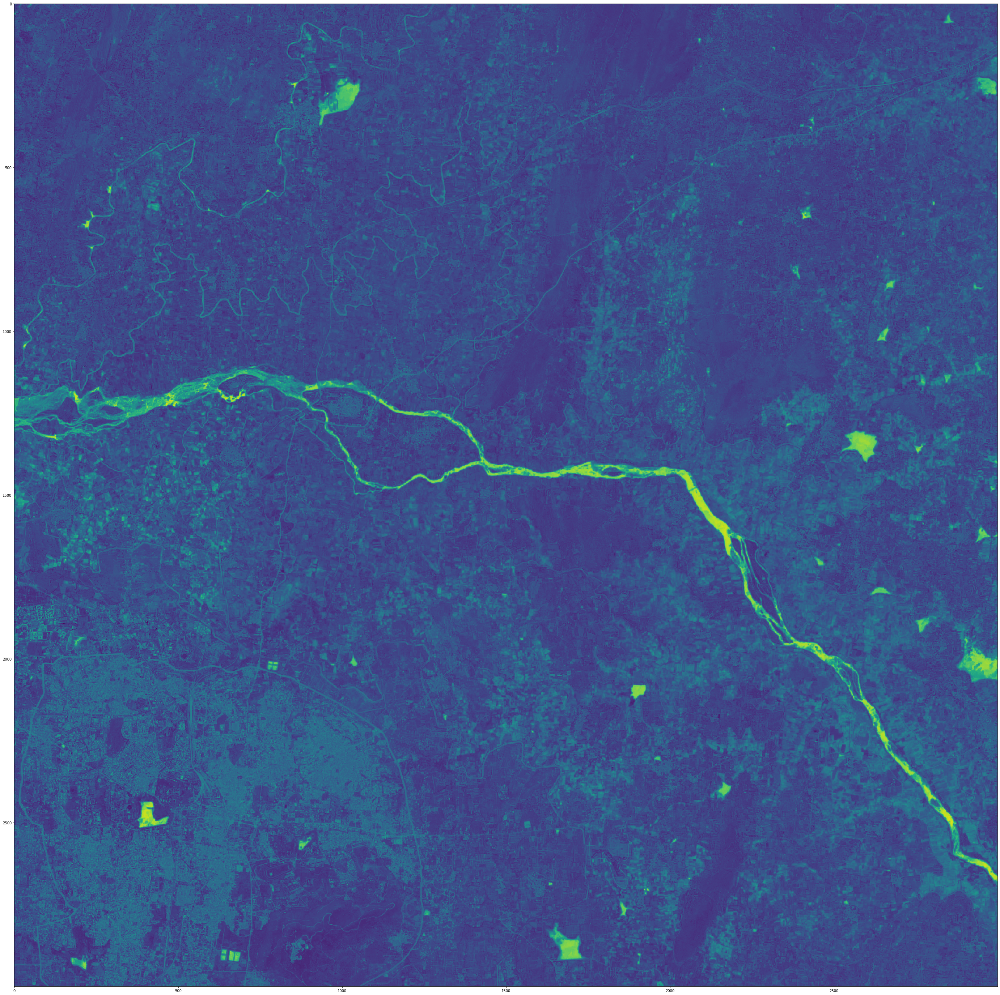

In [111]:
fig = plt.figure(figsize = (50,50))
plot.show(np.array(test_image))

In [ ]:
results = model.predict(X_test)

In [ ]:
for i in range(len(results)):
    print(y_test[i:i+1], results[i])

In [ ]:
clf = svm.SVC(kernel="rbf")
clf.fit(X_train, y_train)

In [ ]:
arr = clf.predict(X_test)

In [ ]:
pd.DataFrame(X_test)

In [ ]:
a, b = list(arr), list(y_test)
true_count = 0
for i in range(6000):
    if(a[i] == b[i]):
        true_count+=1
        print(a[i], b[i], "True")
    else:
        print(a[i], b[i], "False")

In [ ]:
true_count

In [ ]:
X_train